# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

#### Objective Clarity:
Our primary goal is to dig into the factors that really drive the prices of used cars. This understanding will guide us in making precise recommendations to our client, a used car dealership. We want to help them figure out what aspects of a used car are most valued by consumers, so they can fine-tune their pricing strategy accordingly.

#### Stakeholder Insight:
We need to remember that our main partners in this are the folks at the used car dealership. They're eager to enhance their pricing game, aligning it with what consumers truly care about, leading to better sales and profits.

#### Getting into the Know:
It's essential to wrap our heads around the world of used cars. We should dive into how the market works, grasp the significance of things like brand reputation, car age, mileage, and condition, and understand how these factors intertwine to determine pricing.

#### Burning Questions:
We've got some key questions to tackle together, like:

Which car attributes play the biggest role in price variations?
How do elements like brand perception, mileage, and age impact what buyers are willing to pay?
Could specific car features matter more to particular groups of consumers?
Setting the Success Bar:
We need to be clear on how we'll know if we're successful. It could be delivering a predictive model that's super accurate in estimating used car prices or hitting other performance metrics we agree on.

#### Recognizing the Bounds:
Let's be real about what might slow us down. Data might not be complete, some crucial details might be missing, or consumer preferences could be shifting. Also, we've got to handle the data responsibly, especially when it comes to customer data.

#### Visualizing the Impact:
Think about how our insights could make waves. Imagine handing over crystal-clear advice that empowers the dealership to make spot-on decisions about pricing and managing their stock.

Through this process of understanding our business context, we're laying the groundwork to shape our data analysis in a way that truly serves our client's needs and objectives.






### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

#### Dataset Dive:
First things first, let's roll up our sleeves and get up close with the dataset. We're talking about the raw material that's going to fuel our analysis. We need to dig into the numbers, attributes, and details to really get a grip on what's in there.

#### Attributes Exploration:
Each column in that dataset holds a story. We're going to look at all of them, one by one. We need to know what each attribute means, how it's measured, and what kind of values it takes. This'll help us connect the dots later.

#### Patterns and Oddities:
As we're flipping through the rows, we're on the lookout for patterns and oddities. Are there any attributes with lots of missing data? Any outliers that could skew our analysis? We want to make sure we're dealing with clean, reliable info.

#### Data Distribution:
It's like understanding the lay of the land. We're going to plot histograms, scatter plots, and whatever graphs help us see how the data is distributed. This helps us spot trends and relationships among different attributes.

#### Correlations Uncovered:
Are there attributes that seem to dance together? Like, when one goes up, the other follows suit? This is where we're going to calculate correlations. If two attributes have a strong connection, it could mean they affect each other somehow.

#### Missing Data Mystery:
Some attributes might be playing hide and seek with us – missing values. We need to find out how many are missing, and if there's a pattern to it. We might have to decide whether to fill in the gaps or leave them be.

#### Data Quality Check:
We're wearing our detective hats. If there are inconsistencies, like numbers where there should be names or the other way around, we're going to spot them. Clean, consistent data is the name of the game.

#### Preparing for the Next Step:
Our mission here isn't just to know the dataset inside out. It's about understanding what it can tell us about used car prices. We're getting ready to connect the dots between this data and what really matters to our client, the used car dealership.

By diving into the data like this, we're priming ourselves to draw meaningful insights and correlations that can help us deliver impactful recommendations to the dealership.






### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [290]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import warnings
from warnings import filterwarnings 
filterwarnings('ignore')
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from sklearn.metrics import mean_squared_error, mean_absolute_error 
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score




In [291]:
# Read data
cars_df = pd.read_csv('data/vehicles.csv')
cars_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [292]:
cars_df.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


In [293]:
# checking if there are any null values in the column manufacturer
cars_df["manufacturer"].isnull().value_counts()
# setting the NaN condition types to other
cars_df["manufacturer"].fillna("other",inplace=True)

In [294]:
# checking if there are any null values in the column type
cars_df["type"].isnull().value_counts()


False    334022
True      92858
Name: type, dtype: int64

In [295]:
# changing the vehicleType from NaN to Others
cars_df["type"].fillna("other", inplace=True)


In [296]:
cars_df["type"].unique()


array(['other', 'pickup', 'truck', 'coupe', 'SUV', 'hatchback',
       'mini-van', 'sedan', 'offroad', 'bus', 'van', 'convertible',
       'wagon'], dtype=object)

In [297]:
# replace the categorical values with binary
cars_df.replace({'type':{'pickup':0,'truck':1,'coupe':2,'SUV':3, 
                          'hatchback':4,'mini-van':5,'sedan':6,'offroad':7,
                        'bus':8,'van':9,'convertible':10,'wagon':11,'other':12}},inplace=True)

In [298]:
# setting the NaN manufacturer types to other
cars_df["manufacturer"].fillna("other",inplace=True)

In [299]:
# checking if there are any null values in the column model
cars_df["model"].isnull().value_counts()


False    421603
True       5277
Name: model, dtype: int64

In [300]:
# setting the NaN model types to other
cars_df["model"].fillna("other",inplace=True)

In [301]:
# checking if there are any null values in the column year
cars_df["year"].isnull().value_counts()

False    425675
True       1205
Name: year, dtype: int64

In [302]:
# checking if there are any null values in the column odometer
cars_df["odometer"].isnull().value_counts()

False    422480
True       4400
Name: odometer, dtype: int64

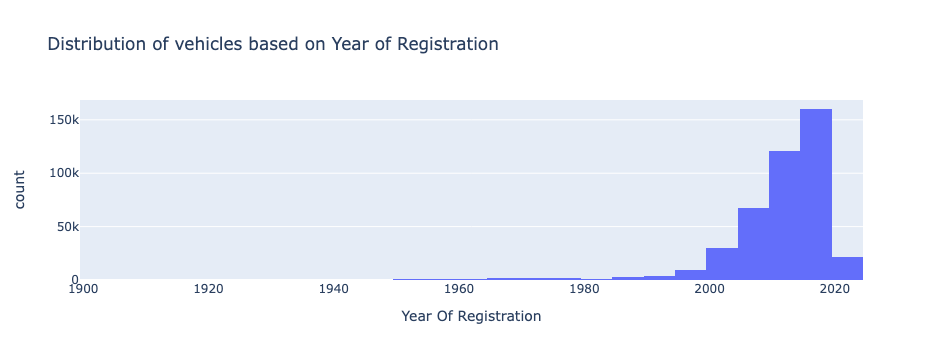

In [304]:
# Create a figure using plotly.express
fig = px.histogram(cars_df, x="year", nbins=50, title='Distribution of vehicles based on Year of Registration')

# Update the x-axis labels
fig.update_xaxes(title_text="Year Of Registration")

# Show the plot
fig.show()


In [215]:
# dropping rows that are inconsistent with the dataset based on year of registration
cars_df = cars_df[(cars_df["year"] >= 1995)]

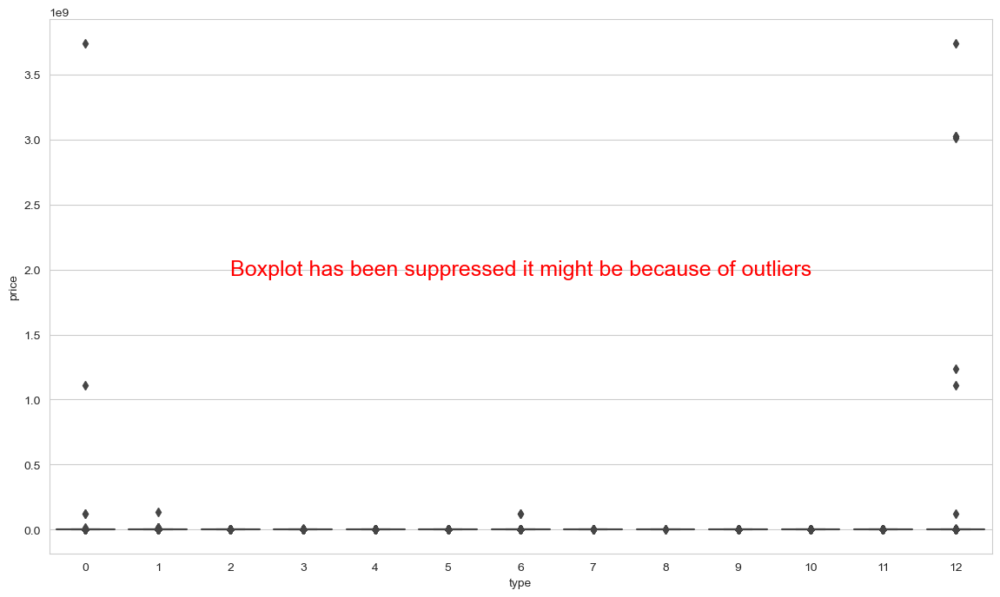

In [216]:
# Boxplot to see the distribution after outliers has been removed
fig, ax = plt.subplots(figsize=(14,8))
sns.boxplot(x="type", y="price", data=cars_df)
ax.text(6,2000000000,"Boxplot has been suppressed it might be because of outliers",fontsize=18,color="r",ha="center", va="center")
plt.show()

#### Find the rows which has both year and odomer are null and drop them. Dropping them because having one of them is a key factor in prdicting the price

In [217]:
# find if year and odometer both are missing for any data points. It is because they both are important
# features in finding the car price. If both missing then we ingore those rows
missing_year_mileage = cars_df[cars_df['year'].isnull() & cars_df['odometer'].isnull()]

print("Rows with both 'Year' and 'Mileage' missing:")
print(len(missing_year_mileage))
# dropping year and odometer missing rows 
cars_df.dropna(subset=['year', 'odometer'], how='all', inplace=True)
# cross check if they got dropped
missing_year_mileage_final = cars_df[cars_df['year'].isnull() & cars_df['odometer'].isnull()]

print("Rows with both 'Year' and 'Mileage' missing:")
print(len(missing_year_mileage_final))

Rows with both 'Year' and 'Mileage' missing:
0
Rows with both 'Year' and 'Mileage' missing:
0


In [218]:
# Calculate median, 25th percentile, and 75th percentile using the agg() function
agg_stats = cars_df.groupby("type")["price"].agg(["median", lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])

# Calculate the IQR using the aggregated statistics
iqr = (agg_stats["<lambda_1>"] - agg_stats["<lambda_0>"]) * 1.5 + agg_stats["median"]
print(iqr)


type
0     56458.875
1     66100.000
2     58210.000
3     39141.000
4     34090.000
5     19888.000
6     30987.500
7     38000.000
8     35500.000
9     41995.000
10    44483.500
11    30361.000
12    43580.000
dtype: float64


In [219]:
# Drop rows dynamically based on calculated IQR values
for vehicle_type, iqr_value in zip(iqr.index, iqr):
    condition = (cars_df.index == vehicle_type) & (cars_df["price"] <= iqr_value)
    cars_df = cars_df[~condition]

cars_df.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
27,7316814884,auburn,33590,2014.0,gmc,sierra 1500 crew cab slt,good,8 cylinders,gas,57923.0,clean,other,3GTP1VEC4EG551563,NaN,NaN,0,white,al
28,7316814758,auburn,22590,2010.0,chevrolet,silverado 1500,good,8 cylinders,gas,71229.0,clean,other,1GCSCSE06AZ123805,NaN,NaN,0,blue,al
29,7316814989,auburn,39590,2020.0,chevrolet,silverado 1500 crew,good,8 cylinders,gas,19160.0,clean,other,3GCPWCED5LG130317,NaN,NaN,0,red,al
30,7316743432,auburn,30990,2017.0,toyota,tundra double cab sr,good,8 cylinders,gas,41124.0,clean,other,5TFRM5F17HX120972,NaN,NaN,0,red,al
31,7316356412,auburn,15000,2013.0,ford,f-150 xlt,excellent,6 cylinders,gas,128000.0,clean,automatic,NaN,rwd,full-size,1,black,al


In [220]:
# checking if the fuel has null values
cars_df["fuel"].isnull().value_counts()

False    407054
True       2725
Name: fuel, dtype: int64

In [221]:
# setting the NaN fuel types to other
cars_df["fuel"].fillna("other",inplace=True)
# checking how many unique types of fuelTypes are present
cars_df["fuel"].unique()

array(['gas', 'other', 'diesel', 'hybrid', 'electric'], dtype=object)

In [222]:
# replace the categorical values with binary
cars_df.replace({'fuel':{'gas':0,'diesel':1,'electric':2,'hybrid':3,'other':4}},inplace=True)

In [223]:
# checking if the condition has null values
cars_df["condition"].isnull().value_counts()


False    241306
True     168473
Name: condition, dtype: int64

In [224]:
# setting the NaN condition types to other
cars_df["condition"].fillna("other",inplace=True)

In [225]:
# checking how many unique types of fuelTypes are present
cars_df["condition"].unique()

array(['good', 'excellent', 'fair', 'like new', 'other', 'new', 'salvage'],
      dtype=object)

In [226]:
# replace the categorical values with binary
cars_df.replace({'condition':{'new':0,'like new':1,'excellent':2,'good':3,
                              'fair':4,'other':5,'salvage':6}},inplace=True)

In [227]:
# checking if the drive has null values
cars_df["drive"].isnull().value_counts()


False    285184
True     124595
Name: drive, dtype: int64

In [228]:
# setting the NaN condition types to other
cars_df["drive"].fillna("other",inplace=True)


In [229]:
# replace the categorical values with binary
cars_df.replace({'drive':{'fwd':0,'rwd':1,'4wd':2,'other':3}},inplace=True)

In [230]:
# checking if the pain color has null values
cars_df["paint_color"].isnull().value_counts()


False    285492
True     124287
Name: paint_color, dtype: int64

In [231]:
# setting the NaN condition types to other
cars_df["paint_color"].fillna("other",inplace=True)
cars_df["paint_color"].unique()

array(['white', 'blue', 'red', 'black', 'silver', 'grey', 'other',
       'brown', 'yellow', 'orange', 'green', 'custom', 'purple'],
      dtype=object)

In [232]:
# replace the categorical values with binary
cars_df.replace({'paint_color':{'white':0,'blue':1,'red':2,'black':3, 
                          'silver':4,'grey':5,'brown':6,'yellow':7,
                          'orange':8,'green':9,'purple':10,'custom':11,'other':12}},inplace=True)

In [233]:
# checking for unique values in title_status
cars_df["title_status"].isnull().value_counts()

False    401906
True       7873
Name: title_status, dtype: int64

In [234]:
# setting the NaN condition types to other
cars_df["title_status"].fillna("other",inplace=True)
cars_df["title_status"].unique()

array(['clean', 'rebuilt', 'lien', 'other', 'salvage', 'missing',
       'parts only'], dtype=object)

In [235]:
# replace the categorical values with binary
cars_df.replace({'title_status':{'clean':0,'lien':1,'rebuilt':2,'missing':3, 
                          'parts only':4,'salvage':5,'other':6}},inplace=True)

In [236]:
# checking for unique values in transmission
cars_df["transmission"].isnull().value_counts()

False    407318
True       2461
Name: transmission, dtype: int64

In [237]:
# setting the NaN condition types to other
cars_df["transmission"].fillna("other",inplace=True)
cars_df["transmission"].unique()

array(['other', 'automatic', 'manual'], dtype=object)

In [238]:
# replace the categorical values with binary
cars_df.replace({'transmission':{'automatic':0,'manual':1,'other':2}},inplace=True)

In [239]:
# Get the list of all column names from headers and print missing values
def print_missing_column_values(df):
    column_headers = list(df.columns.values)
    print("The Column Header :", column_headers)
    for column in column_headers:
        missing_count_man_model = df[column].isnull().sum()
        print(column + " - Total count of missing values:", missing_count_man_model)


#### Function to fill missing values of columns based on the mode

In [240]:
# function to fill missing values with mode.
def fill_values_with_mode(columns):
    for column in columns:
        # Calculate the mode of the column
        condition_mode = cars_df[column].mode()[0]
        # Fill missing values with the mode
        cars_df[column].fillna(condition_mode, inplace=True)
# Print the DataFrame after filling missing values
print_missing_column_values(cars_df)


The Column Header : ['id', 'region', 'price', 'year', 'manufacturer', 'model', 'condition', 'cylinders', 'fuel', 'odometer', 'title_status', 'transmission', 'VIN', 'drive', 'size', 'type', 'paint_color', 'state']
id - Total count of missing values: 0
region - Total count of missing values: 0
price - Total count of missing values: 0
year - Total count of missing values: 0
manufacturer - Total count of missing values: 0
model - Total count of missing values: 0
condition - Total count of missing values: 0
cylinders - Total count of missing values: 172724
fuel - Total count of missing values: 0
odometer - Total count of missing values: 4292
title_status - Total count of missing values: 0
transmission - Total count of missing values: 0
VIN - Total count of missing values: 147468
drive - Total count of missing values: 0
size - Total count of missing values: 296127
type - Total count of missing values: 0
paint_color - Total count of missing values: 0
state - Total count of missing values: 0


In [241]:
# checking if the state has null values
cars_df["state"].isnull().value_counts()


False    409779
Name: state, dtype: int64

In [242]:
# checking unique values
cars_df["state"].unique()

array(['al', 'ak', 'az', 'ar', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga',
       'hi', 'id', 'il', 'in', 'ia', 'ks', 'ky', 'la', 'me', 'md', 'ma',
       'mi', 'mn', 'ms', 'mo', 'mt', 'nc', 'ne', 'nv', 'nj', 'nm', 'ny',
       'nh', 'nd', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx',
       'ut', 'vt', 'va', 'wa', 'wv', 'wi', 'wy'], dtype=object)

In [243]:
# converting states to number 
states = cars_df['state'].unique()
state_to_number = {state: i for i, state in enumerate(states)}

# Map states to their corresponding sequential numbers and replace the column
cars_df['state'] = cars_df['state'].map(state_to_number)

In [244]:
# checking if the region has null values
cars_df["region"].isnull().value_counts()

False    409779
Name: region, dtype: int64

In [245]:
# converting region to number 
regions = cars_df['region'].unique()
region_to_number = {region: i for i, region in enumerate(regions)}

# Map states to their corresponding sequential numbers and replace the column
cars_df['region'] = cars_df['region'].map(region_to_number)

#### Variation of the price range by the vehicle type

In [246]:
# Creating a function to find the outliers from the columns. 
# This will be used for most of the columns to elimnate outliers.
def find_outliers(column_data):
    # Calculate the IQR (Interquartile Range)
    Q1 = column_data.quantile(0.25)
    Q3 = column_data.quantile(0.75)
    IQR = Q3 - Q1

    # Calculate the lower and upper bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Find outliers
    outliers = column_data[(column_data < lower_bound) | (column_data > upper_bound)]
    return outliers


#### Finding outliers

In [247]:
outlier_columns = ['price','odometer']
for outlier in outlier_columns:
    outlier_result = find_outliers(cars_df[outlier])
    # print(outlier,outlier_result)
    print(outlier,len(outlier_result))

price 7541
odometer 3757


In [248]:
max_price = cars_df['price'].max()
print(max_price)
min_price = cars_df['price'].min()
print(min_price)
# Assuming your DataFrame is named 'df'
max_price_index = cars_df['price'].idxmax()

max_price_year = cars_df.loc[max_price_index, 'year']
max_price_odometer = cars_df.loc[max_price_index, 'odometer']
max_price_manufacturer = cars_df.loc[max_price_index, 'manufacturer']

print("Year of Max Price:", max_price_year)
print("Odometer of Max Price:", max_price_odometer)
print("Manufacturer of Max Price:", max_price_manufacturer)


3736928711
0
Year of Max Price: 2007.0
Odometer of Max Price: 164000.0
Manufacturer of Max Price: toyota


#### Removing outliers from price and odometer columns

In [249]:
# Define a threshold to identify outliers. In the data I see values like 987654321 which is not practicle. So removing them
price_threshold = 100000  # Adjust this threshold based on your data

# Remove rows with 'price' greater than the threshold
cars_df = cars_df[cars_df['price'] <= price_threshold]


# Define a threshold to identify outliers. In the data I see values like 9999999.0 which is not practicle. So removing them
odometer_threshold = 300000  # Adjust this threshold based on your data

# Remove rows with 'price' greater than the threshold
cars_df = cars_df[cars_df['odometer'] <= odometer_threshold]
# check if model of the car and year it is not vintage range then drop it.




#### Find if any missing odomer values are. If so based on assumption that a car will drive minimum 10K miles per year , replacing the odomer with year * 10K 

In [250]:
missing_odomter_count = cars_df['odometer'].isnull().sum()
print("Total count of missing_odomter_count values:", missing_odomter_count)

# Select rows where 'odometer' is null and get the corresponding 'year' values
missing_year_values = cars_df.loc[cars_df['odometer'].isnull(), 'year']

# Print the missing 'year' values where 'odometer' is null
print("Missing 'year' values where 'odometer' is null:")
print(missing_year_values)

# Calculate the missing 'odometer' values based on the assumption of 10,000 miles per year
cars_df.loc[cars_df['odometer'].isnull(), 'odometer'] = cars_df['year'] * 10000

# Print the DataFrame with updated 'odometer' values
print(cars_df[['year', 'odometer']])

missing_odometer_count_after_fill = cars_df['odometer'].isnull().sum()
print("Total count of missing_odomter_count values:", missing_odometer_count_after_fill)

Total count of missing_odomter_count values: 0
Missing 'year' values where 'odometer' is null:
Series([], Name: year, dtype: float64)
          year  odometer
27      2014.0   57923.0
28      2010.0   71229.0
29      2020.0   19160.0
30      2017.0   41124.0
31      2013.0  128000.0
...        ...       ...
426875  2019.0   32226.0
426876  2020.0   12029.0
426877  2020.0    4174.0
426878  2018.0   30112.0
426879  2019.0   22716.0

[402416 rows x 2 columns]
Total count of missing_odomter_count values: 0


#### Trying to find year based on the odomer reading. 

In [251]:
# Calculate the average miles per year
average_miles_per_year = 10000

# Calculate the missing 'year' values based on the assumption of 10,000 miles per year
cars_df.loc[cars_df['year'].isnull(), 'year'] = cars_df['odometer'] / average_miles_per_year

# Round the calculated years to integers
cars_df['year'] = cars_df['year'].round().astype(int)

# Print the DataFrame with updated 'year' values
print(cars_df[['odometer', 'year']])


        odometer  year
27       57923.0  2014
28       71229.0  2010
29       19160.0  2020
30       41124.0  2017
31      128000.0  2013
...          ...   ...
426875   32226.0  2019
426876   12029.0  2020
426877    4174.0  2020
426878   30112.0  2018
426879   22716.0  2019

[402416 rows x 2 columns]


#### Droppoing columns which are not needed for analysis

In [252]:
columns_to_drop = ['VIN', 'size','cylinders','id']
cars_df.drop(columns=columns_to_drop, inplace=True)


In [253]:
max_price = cars_df['price'].max()
print(max_price)

100000


#### Group by Manufacturer: 
Group  dataset by the 'manufacturer' column.

#### Count Models: 
For each manufacturer group, count the frequency of each 'model' in that group. This will give you an idea of the most common models associated with each manufacturer.

##### Fill Missing Models:
For rows with missing 'model' values and a known 'manufacturer', you can fill in the missing 'model' with the most common 'model' within that manufacturer group.



In [254]:
# Group by manufacturer and count models
manufacturer_model_counts = cars_df.groupby('manufacturer')['model'].value_counts()

def fill_missing_model(row):
    if pd.isnull(row['model']) and not pd.isnull(row['manufacturer']):
        manufacturer = row['manufacturer']
        if manufacturer in manufacturer_model_counts.index:
            most_common_model = manufacturer_model_counts[manufacturer].idxmax()
            return most_common_model
    return row['model']

# Apply the function to fill missing 'model' values
cars_df['model'] = cars_df.apply(fill_missing_model, axis=1)

missing_count_model = cars_df['model'].isnull().sum()
print("Total count of missing values:", missing_count_model)




Total count of missing values: 0


#### Find any missing columns still presists

In [255]:
print_missing_column_values(cars_df)
cars_df.head()

The Column Header : ['region', 'price', 'year', 'manufacturer', 'model', 'condition', 'fuel', 'odometer', 'title_status', 'transmission', 'drive', 'type', 'paint_color', 'state']
region - Total count of missing values: 0
price - Total count of missing values: 0
year - Total count of missing values: 0
manufacturer - Total count of missing values: 0
model - Total count of missing values: 0
condition - Total count of missing values: 0
fuel - Total count of missing values: 0
odometer - Total count of missing values: 0
title_status - Total count of missing values: 0
transmission - Total count of missing values: 0
drive - Total count of missing values: 0
type - Total count of missing values: 0
paint_color - Total count of missing values: 0
state - Total count of missing values: 0


,region,price,year,manufacturer,model,condition,fuel,odometer,title_status,transmission,drive,type,paint_color,state
27,0,33590,2014,gmc,sierra 1500 crew cab slt,3,0,57923.0,0,2,3,0,0,0
28,0,22590,2010,chevrolet,silverado 1500,3,0,71229.0,0,2,3,0,1,0
29,0,39590,2020,chevrolet,silverado 1500 crew,3,0,19160.0,0,2,3,0,2,0
30,0,30990,2017,toyota,tundra double cab sr,3,0,41124.0,0,2,3,0,2,0
31,0,15000,2013,ford,f-150 xlt,2,0,128000.0,0,0,1,1,3,0


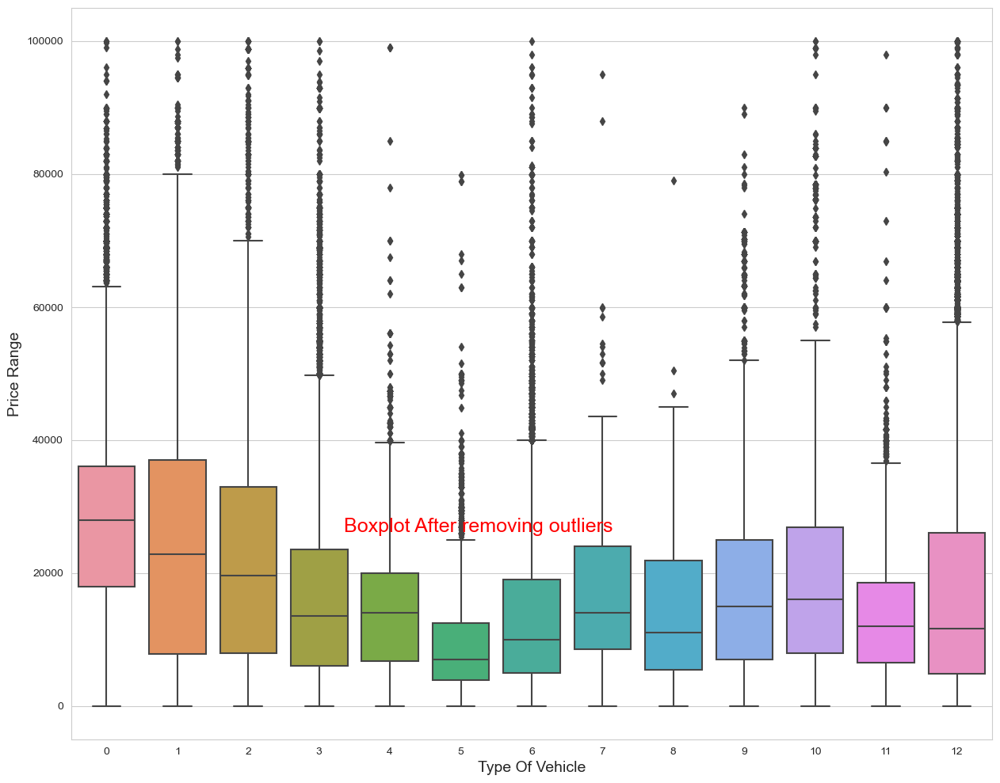

In [256]:
# Boxplot to see the distribution after outliers has been removed
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(15,12))
sns.boxplot(x="type", y="price", data=cars_df)
ax.text(5.25,27000,"Boxplot After removing outliers",fontsize=18,color="r",ha="center", va="center")
ax.xaxis.set_label_text("Type Of Vehicle",fontdict= {'size':14})
ax.yaxis.set_label_text("Price Range",fontdict= {'size':14})
plt.show()

In [257]:
cars_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 402416 entries, 27 to 426879
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   region        402416 non-null  int64  
 1   price         402416 non-null  int64  
 2   year          402416 non-null  int64  
 3   manufacturer  402416 non-null  object 
 4   model         402416 non-null  object 
 5   condition     402416 non-null  int64  
 6   fuel          402416 non-null  int64  
 7   odometer      402416 non-null  float64
 8   title_status  402416 non-null  int64  
 9   transmission  402416 non-null  int64  
 10  drive         402416 non-null  int64  
 11  type          402416 non-null  int64  
 12  paint_color   402416 non-null  int64  
 13  state         402416 non-null  int64  
dtypes: float64(1), int64(11), object(2)
memory usage: 46.1+ MB


In [258]:
# converting manufacturer to number 
manufacturers = cars_df['manufacturer'].unique()
manufacturer_to_number = {manufacturer: i for i, manufacturer in enumerate(manufacturers)}

# Map manufacturers to their corresponding sequential numbers and replace the column
cars_df['manufacturer_int'] = cars_df['manufacturer'].map(manufacturer_to_number)

In [259]:
# converting model to number 
models = cars_df['model'].unique()
model_to_number = {model: i for i, model in enumerate(models)}

# Map model to their corresponding sequential numbers and replace the column
cars_df['model_int'] = cars_df['model'].map(model_to_number)

In [260]:
cars_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 402416 entries, 27 to 426879
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   region            402416 non-null  int64  
 1   price             402416 non-null  int64  
 2   year              402416 non-null  int64  
 3   manufacturer      402416 non-null  object 
 4   model             402416 non-null  object 
 5   condition         402416 non-null  int64  
 6   fuel              402416 non-null  int64  
 7   odometer          402416 non-null  float64
 8   title_status      402416 non-null  int64  
 9   transmission      402416 non-null  int64  
 10  drive             402416 non-null  int64  
 11  type              402416 non-null  int64  
 12  paint_color       402416 non-null  int64  
 13  state             402416 non-null  int64  
 14  manufacturer_int  402416 non-null  int64  
 15  model_int         402416 non-null  int64  
dtypes: float64(1), int6

#### Trying to find the corellation matrix for all the features.

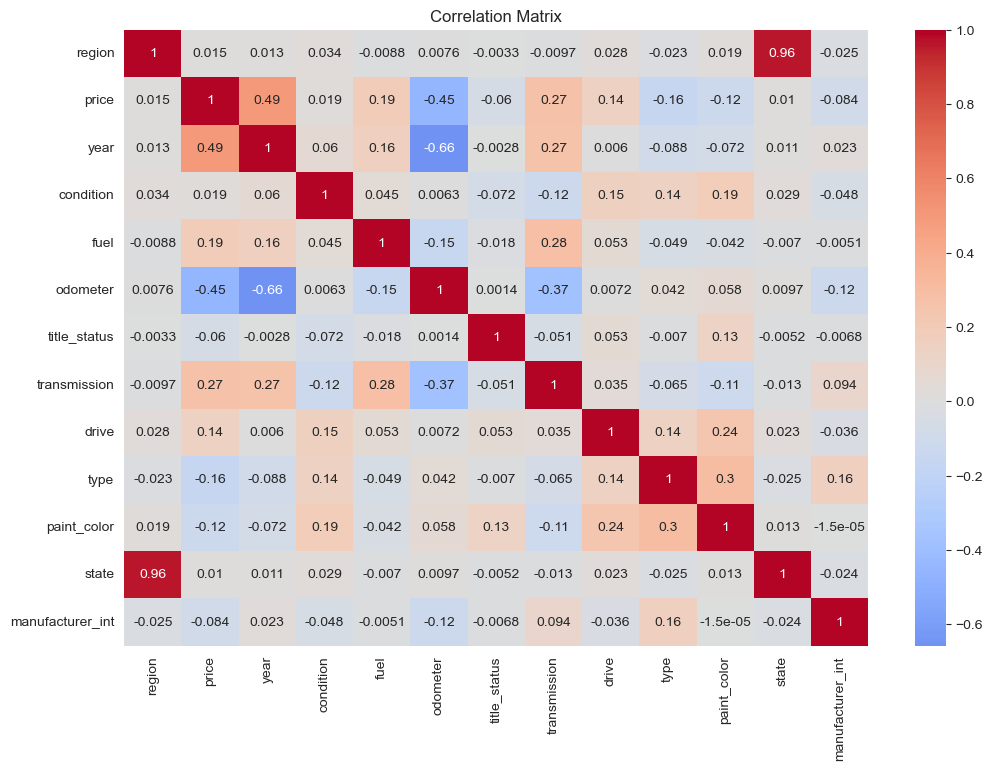

In [261]:
columns_of_interest = ['region', 'price', 'year', 'model', 'condition', 'fuel', 'odometer',
                       'title_status', 'transmission', 'drive', 'type', 'paint_color', 'state','manufacturer_int']

# Select the columns of interest from the DataFrame
selected_df = cars_df[columns_of_interest]

# Calculate correlation matrix for selected columns
corr_matrix = selected_df.corr()

# Plot the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix')
plt.show()


In [262]:
cars_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 402416 entries, 27 to 426879
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   region            402416 non-null  int64  
 1   price             402416 non-null  int64  
 2   year              402416 non-null  int64  
 3   manufacturer      402416 non-null  object 
 4   model             402416 non-null  object 
 5   condition         402416 non-null  int64  
 6   fuel              402416 non-null  int64  
 7   odometer          402416 non-null  float64
 8   title_status      402416 non-null  int64  
 9   transmission      402416 non-null  int64  
 10  drive             402416 non-null  int64  
 11  type              402416 non-null  int64  
 12  paint_color       402416 non-null  int64  
 13  state             402416 non-null  int64  
 14  manufacturer_int  402416 non-null  int64  
 15  model_int         402416 non-null  int64  
dtypes: float64(1), int6

In [263]:
def split_data(df):
    # Drop missing values and reset index
    data = df.dropna().reset_index(drop=True)

    # Select features and target
    X = data.drop('price', axis=1)
    y = data['price']

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Label encode categorical features in X
    categorical_cols = X.select_dtypes(include=['object']).columns

    print("Unique values in y_train:", y_train.unique())
    print("Unique values in y_test:", y_test.unique())

    categorical_cols = X.select_dtypes(include=['object']).columns
    for col in categorical_cols:
        X_train[col]  = label_encoder.fit_transform(X_train[col])
        X_test[col] = label_encoder.fit_transform(X_test[col])
    return X_train, X_test, y_train, y_test

#### Trying to find right features to model and predictions with various techniques. 
#### First Method: RandomForestRegressor

In [264]:
filtered_df = cars_df
drop_columns = ['manufacturer','model']
filtered_df.drop(columns=drop_columns, inplace=True)

X_train, X_test, y_train, y_test = split_data(filtered_df)
    
# Create a Random Forest regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model
rf_model.fit(X_train, y_train)

# Evaluate the model
accuracy = rf_model.score(X_test, y_test)
print(f"Model Accuracy: {accuracy:.2f}")

# Get the feature importance scores
feature_importances = rf_model.feature_importances_

# Sort features by importance and select the top ones
selected_features = X_train.columns[np.argsort(feature_importances)[::-1][:5]]
print(selected_features)

Unique values in y_train: [ 9900 31995  7500 ... 78990 12883  9923]
Unique values in y_test: [13980  3995 11995 ...  5190 42800   188]
Model Accuracy: 0.82
Index(['year', 'odometer', 'model_int', 'drive', 'type'], dtype='object')


#### Second Method: RFE (Recursive Feature Elimination): Eliminate less important features iteratively based on the model's performance

In [265]:
# Create a linear regression model
model = LinearRegression()

# Create an RFE selector with the model and desired number of features
rfe_selector = RFE(model, n_features_to_select=5)

# Fit the selector to the data
rfe_selector.fit(X_train, y_train)

# Get the selected features
selected_features = X_train.columns[rfe_selector.support_]

print(selected_features)


Index(['year', 'fuel', 'title_status', 'transmission', 'drive'], dtype='object')


#### Doing PCA analysis on the features what were found by RFE

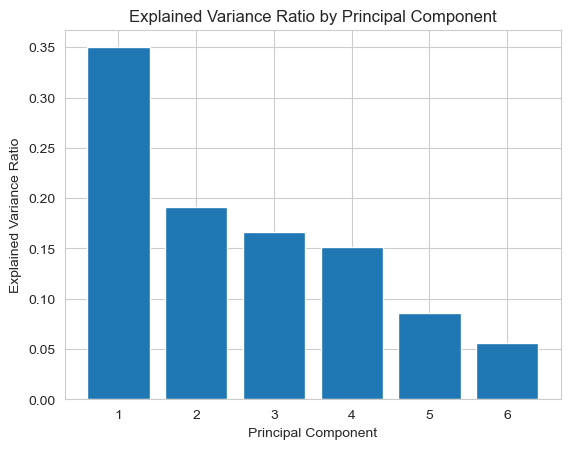

In [266]:
# Scale numerical features
numerical_columns = ['price', 'year', 'odometer', 'model_int', 'drive', 'type']
scaler = StandardScaler()
scaled_numerical = scaler.fit_transform(filtered_df[numerical_columns])

# Apply PCA on scaled numerical features
pca = PCA()
transformed_numerical = pca.fit_transform(scaled_numerical)
# Bar graph for explained variance ratios
explained_variance_ratio = pca.explained_variance_ratio_
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Principal Component')
plt.show()




In [282]:
print('Explained Variance Ratio by Principal Component:',explained_variance_ratio)

Explained Variance Ratio by Principal Component: [0.34998531 0.19102183 0.16611227 0.15096569 0.08580491 0.05611   ]


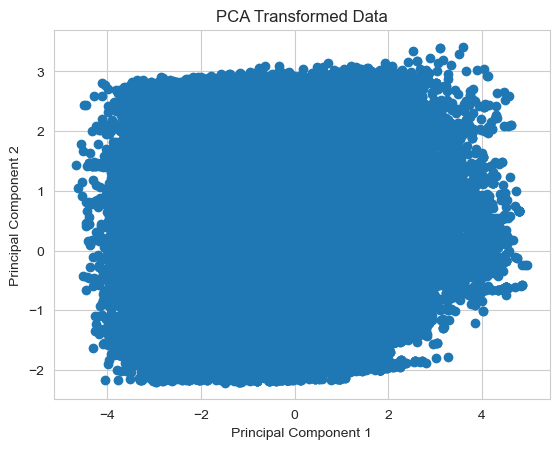

In [267]:
# Visualize the transformed data in a scatter plot
plt.scatter(transformed_numerical[:, 0], transformed_numerical[:, 1])
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Transformed Data")
plt.show()


#### Create data frame from transformed data in PCA analysis

In [268]:
# Create a DataFrame for the PCA-transformed numerical features
pca_columns = [f'PCA{i+1}' for i in range(transformed_numerical.shape[1])]
pca_df = pd.DataFrame(transformed_numerical, columns=pca_columns)

# Concatenate the PCA-transformed numerical features with the original numerical columns
model_input_df = pd.concat([filtered_df[numerical_columns], pca_df], axis=1)

In [269]:
rows, columns = filtered_df.shape
print(f"Number of rows: {rows}")
print(f"Number of columns: {columns}")
rows1, columns1 = model_input_df.shape
print(f"Number of rows: {rows1}")
print(f"Number of columns: {columns1}")


Number of rows: 402416
Number of columns: 14
Number of rows: 425481
Number of columns: 12


In [270]:
model_input_df.info

<bound method DataFrame.info of           price    year  odometer  model_int  drive  type      PCA1      PCA2  \
27      33590.0  2014.0   57923.0        0.0    3.0   0.0 -0.612146 -0.757439   
28      22590.0  2010.0   71229.0        1.0    3.0   0.0  0.681315  0.930653   
29      39590.0  2020.0   19160.0        2.0    3.0   0.0  1.702717 -0.077985   
30      30990.0  2017.0   41124.0        3.0    3.0   0.0  1.342731 -0.092779   
31      15000.0  2013.0  128000.0        4.0    1.0   1.0 -0.268392 -1.366442   
...         ...     ...       ...        ...    ...   ...       ...       ...   
402353      NaN     NaN       NaN        NaN    NaN   NaN -2.955960  1.605716   
402359      NaN     NaN       NaN        NaN    NaN   NaN  2.460393  0.472348   
402364      NaN     NaN       NaN        NaN    NaN   NaN  1.366602  0.773457   
402369      NaN     NaN       NaN        NaN    NaN   NaN -3.249364 -0.480424   
402381      NaN     NaN       NaN        NaN    NaN   NaN  0.022883  0.256920

#### Fill the model_input_df with median values

In [274]:
import pandas as pd
from sklearn.impute import SimpleImputer

# Create an imputer instance
imputer = SimpleImputer(strategy='median')

# Apply the imputer to fill missing values for all columns
model_input_df_filled = pd.DataFrame(imputer.fit_transform(model_input_df), columns=model_input_df.columns)


### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

#### Now that data is cleaned I'm trying to use LinearRegression and RandomForestRegressor

In [275]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Separate features and target variable
X = model_input_df_filled.drop('price', axis=1)
y = model_input_df_filled['price']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
linear_reg = LinearRegression()
random_forest_reg = RandomForestRegressor(random_state=42)

# Train models
linear_reg.fit(X_train, y_train)
random_forest_reg.fit(X_train, y_train)

# Make predictions
linear_reg_pred = linear_reg.predict(X_test)
random_forest_pred = random_forest_reg.predict(X_test)

# Evaluate models
linear_reg_mse = mean_squared_error(y_test, linear_reg_pred)
random_forest_mse = mean_squared_error(y_test, random_forest_pred)

print("Linear Regression MSE:", linear_reg_mse)
print("Random Forest Regression MSE:", random_forest_mse)


Linear Regression MSE: 143805224.97673395
Random Forest Regression MSE: 62622430.78531609


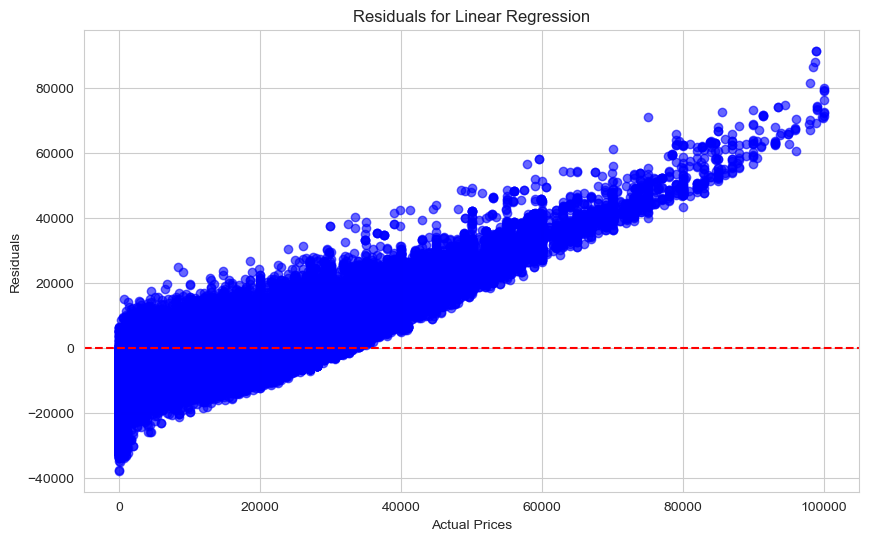

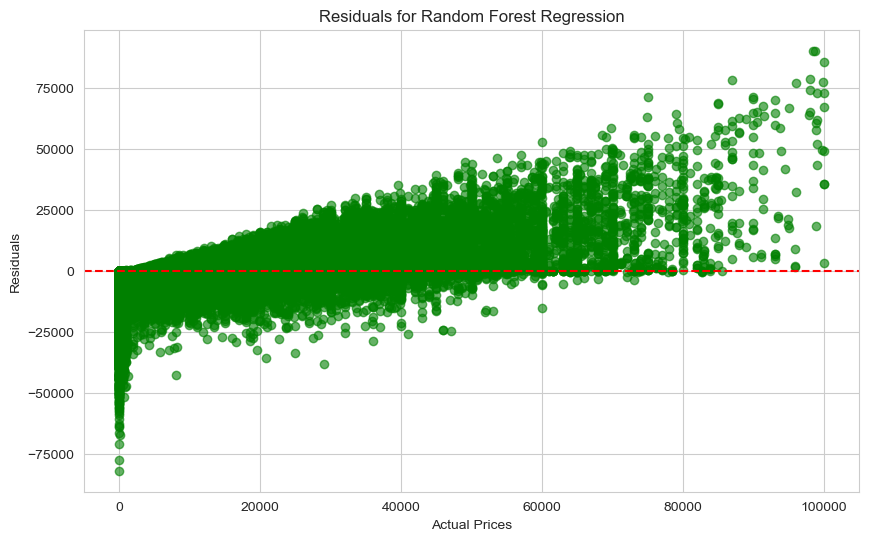

In [283]:
# Calculate residuals for Linear Regression
linear_reg_residuals = y_test - linear_reg_pred

# Calculate residuals for Random Forest Regression
random_forest_residuals = y_test - random_forest_pred

# Scatter plot of Residuals for Linear Regression
plt.figure(figsize=(10, 6))
plt.scatter(y_test, linear_reg_residuals, color='blue', alpha=0.6)
plt.axhline(y=0, color='red', linestyle='--')
plt.title("Residuals for Linear Regression")
plt.xlabel("Actual Prices")
plt.ylabel("Residuals")
plt.grid(True)
plt.show()

# Scatter plot of Residuals for Random Forest Regression
plt.figure(figsize=(10, 6))
plt.scatter(y_test, random_forest_residuals, color='green', alpha=0.6)
plt.axhline(y=0, color='red', linestyle='--')
plt.title("Residuals for Random Forest Regression")
plt.xlabel("Actual Prices")
plt.ylabel("Residuals")
plt.grid(True)
plt.show()


#### Using PolynomialFeatures to predict 

In [953]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score

# Create PolynomialFeatures instance
poly = PolynomialFeatures(degree=2)  # You can adjust the degree as needed

# Generate polynomial features
X_poly = poly.fit_transform(model_input_df_filled)  # Assuming you have filled data

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

# Create and fit your regression model (e.g., LinearRegression, RandomForestRegressor, etc.)
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate your model's performance

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

# Calculate R-squared (Coefficient of Determination)
r2 = r2_score(y_test, y_pred)
print(f"R-squared (Coefficient of Determination): {r2}")

Mean Squared Error: 3.432589280987441e-17
R-squared (Coefficient of Determination): 1.0


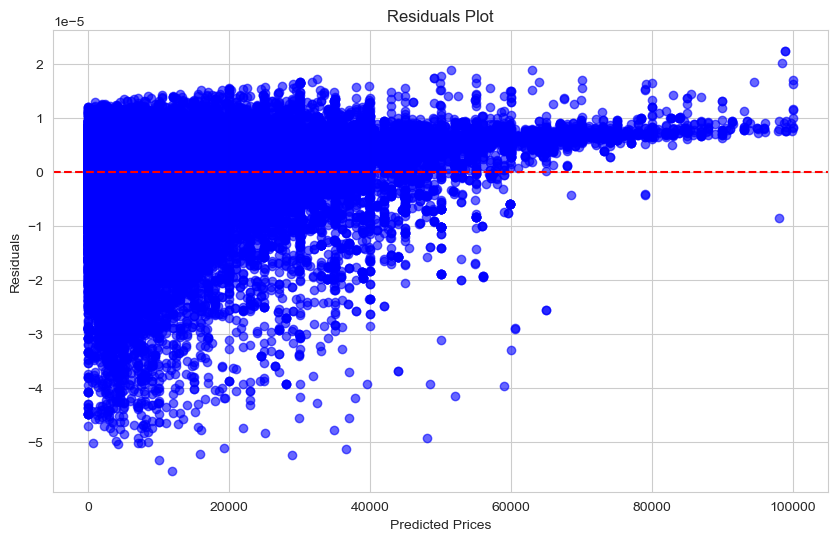

In [284]:

# Calculate residuals
residuals = y_test - y_pred

# Scatter plot of residuals
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, color='blue', alpha=0.6)
plt.axhline(y=0, color='red', linestyle='--')
plt.title("Residuals Plot")
plt.xlabel("Predicted Prices")
plt.ylabel("Residuals")
plt.grid(True)
plt.show()


### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

#### Using hyperparameters to the models 
#### Find the best combination of hyperparameters for improved model performance

In [273]:
from sklearn.model_selection import GridSearchCV

# Define parameter grids for both models
linear_reg_param_grid = {}
random_forest_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

# Initialize GridSearchCV for Linear Regression
linear_reg_grid_search = GridSearchCV(LinearRegression(), param_grid=linear_reg_param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Initialize GridSearchCV for Random Forest Regression
random_forest_grid_search = GridSearchCV(RandomForestRegressor(random_state=42), param_grid=random_forest_param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Perform grid search and train models
linear_reg_grid_search.fit(X_train, y_train)
random_forest_grid_search.fit(X_train, y_train)

# Get the best estimators from grid search
best_linear_reg = linear_reg_grid_search.best_estimator_
best_random_forest_reg = random_forest_grid_search.best_estimator_

# Make predictions using the best models
linear_reg_pred = best_linear_reg.predict(X_test)
random_forest_pred = best_random_forest_reg.predict(X_test)

# Calculate mean squared errors
linear_reg_mse = mean_squared_error(y_test, linear_reg_pred)
random_forest_mse = mean_squared_error(y_test, random_forest_pred)

print("Linear Regression MSE after adding hyperparameters:", linear_reg_mse)
print("Random Forest Regression MSE after adding hyperparameters:", random_forest_mse)


Linear Regression MSE after adding hyperparameters: 141935313.6766389
Random Forest Regression MSE after adding hyperparameters: 38005253.6828506


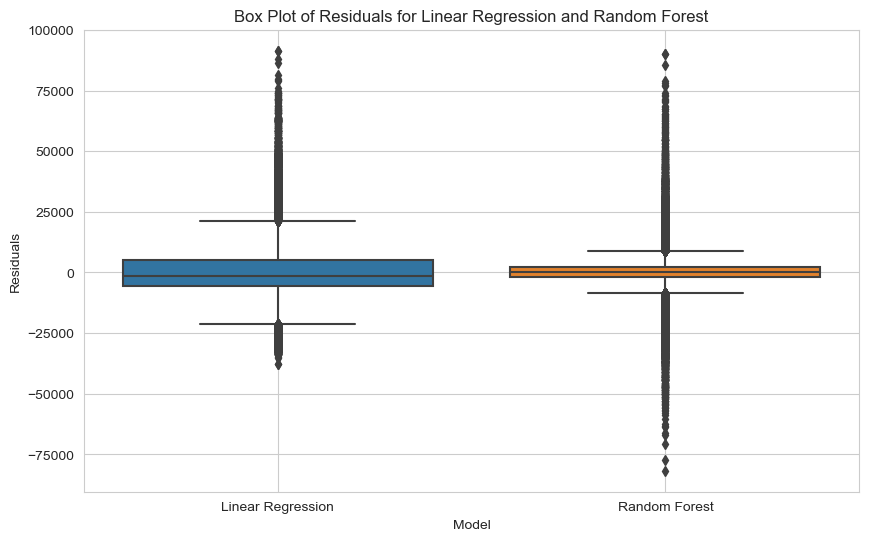

In [285]:
# Calculate residuals for Linear Regression and Random Forest
linear_reg_residuals = y_test - linear_reg_pred
random_forest_residuals = y_test - random_forest_pred

# Combine residuals and model names for plotting
residuals_data = {
    'Linear Regression': linear_reg_residuals,
    'Random Forest': random_forest_residuals
}

# Convert residuals_data to a DataFrame
residuals_df = pd.DataFrame(residuals_data)

# Create a box plot
plt.figure(figsize=(10, 6))
sns.boxplot(data=residuals_df)
plt.title("Box Plot of Residuals for Linear Regression and Random Forest")
plt.xlabel("Model")
plt.ylabel("Residuals")
plt.grid(True)
plt.show()


#### Using PolynomialFeatures and GridSearchCV to predict 

In [277]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

# Create PolynomialFeatures instance
poly = PolynomialFeatures(degree=2)

# Generate polynomial features
X_poly = poly.fit_transform(model_input_df_filled)  # Assuming you have filled data
y = model_input_df_filled['price']  # Assuming 'price' is your target variable

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

# Create a Linear Regression model
model = LinearRegression()

# Define hyperparameters and values to tune
param_grid = {
    'fit_intercept': [True, False]
}

# Create GridSearchCV instance
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Get the best estimator with tuned hyperparameters
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Evaluate your model's performance

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

# Calculate R-squared (Coefficient of Determination)
r2 = r2_score(y_test, y_pred)
print(f"R-squared (Coefficient of Determination): {r2}")

# Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)


Mean Squared Error: 5.694119080596736e-11
R-squared (Coefficient of Determination): 1.0
Best Hyperparameters: {'fit_intercept': True}


#### Cross validation on the Linear and RandomForest models

In [278]:
import pandas as pd
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, make_scorer

# Define the number of folds
n_folds = 5

# Split your dataset into features (X) and target (y)
X = model_input_df_filled  # Your features
y = model_input_df_filled['price']  # Your target

# Create regression models
linear_reg_model = LinearRegression()
random_forest_model = RandomForestRegressor()

# Define the mean squared error as the scoring metric
scorer = make_scorer(mean_squared_error)

# Perform K-Fold Cross-Validation for Linear Regression
linear_reg_scores = cross_val_score(linear_reg_model, X, y, cv=n_folds, scoring=scorer)
linear_reg_mse = linear_reg_scores.mean()

# Perform K-Fold Cross-Validation for Random Forest Regression
random_forest_scores = cross_val_score(random_forest_model, X, y, cv=n_folds, scoring=scorer)
random_forest_mse = random_forest_scores.mean()

# Print the mean squared error for each model
print("Linear Regression Cross validation Mean Squared Error:", linear_reg_mse)
print("Random Forest Regression Cross validation Mean Squared Error:", random_forest_mse)


Linear Regression Cross validation Mean Squared Error: 3.365416396977807e-16
Random Forest Regression Cross validation Mean Squared Error: 14.392935875723103


In [279]:
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Define the number of folds
n_folds = 5

# Split your dataset into features (X) and target (y)
X = model_input_df_filled.drop('price', axis=1)  # Your features without the target column
y = model_input_df_filled['price']  # Your target

# Create a Random Forest Regressor model
random_forest_model = RandomForestRegressor()

# Fit the model on your training data
random_forest_model.fit(X, y)

# Perform cross-validation to get mean squared error scores
mse_scores = cross_val_score(random_forest_model, X, y, cv=n_folds, scoring='neg_mean_squared_error')

# Convert negative scores to positive (mean squared error)
mse_scores = -mse_scores

# Calculate the average mean squared error
average_mse = mse_scores.mean()

# Print the mean squared error for each fold
for i, mse in enumerate(mse_scores):
    print(f"Fold {i+1} Mean Squared Error: {mse}")

# Print the average mean squared error
print("Average Mean Squared Error:", average_mse)

# Perform cross-validation to get predicted target values
predicted_y = cross_val_predict(random_forest_model, X, y, cv=n_folds)

# Calculate R-squared
r_squared = random_forest_model.score(X, y)

# Print R-squared
print("R-squared (Coefficient of Determination):", r_squared)

# Calculate Mean Squared Error between predicted and actual target values
mse = mean_squared_error(y, predicted_y)
print("Overall Mean Squared Error:", mse)


Fold 1 Mean Squared Error: 101226399.90085071
Fold 2 Mean Squared Error: 84088738.58230588
Fold 3 Mean Squared Error: 67241840.43926248
Fold 4 Mean Squared Error: 88288042.84911525
Fold 5 Mean Squared Error: 75525019.58773378
Average Mean Squared Error: 83274008.27185361
R-squared (Coefficient of Determination): 0.95892731422309
Overall Mean Squared Error: 83364730.66456315


In [280]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, make_scorer

# Define the number of folds
n_folds = 5

# Split your dataset into features (X) and target (y)
X = model_input_df_filled  # Your features
y = model_input_df_filled['price']  # Your target


# Create polynomial features
degree = 2  # Choose the degree of polynomial features
poly = PolynomialFeatures(degree)
X_poly = poly.fit_transform(X)

# Create a regression model
poly_reg_model = LinearRegression()

# Define the mean squared error as the scoring metric
scorer = make_scorer(mean_squared_error)

# Perform K-Fold Cross-Validation for Polynomial Regression
poly_reg_scores = cross_val_score(poly_reg_model, X_poly, y, cv=n_folds, scoring=scorer)
poly_reg_mse = poly_reg_scores.mean()

# Print the mean squared error for Polynomial Regression
print("Polynomial Regression Mean Squared Error:", poly_reg_mse)


Polynomial Regression Mean Squared Error: 1.69886549335063e-11


### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

### Evaluation and Analysis of Regression Models

In this analysis, we examine the performance of several regression models applied to a dataset predicting vehicle prices. We evaluate the models using various metrics, including Mean Squared Error (MSE) and R-squared (Coefficient of Determination), and employ techniques like cross-validation to ensure a robust assessment.

#### Linear Regression and Random Forest Models:

Linear Regression MSE: 143,805,224.98
Random Forest Regression MSE: 62,622,430.79
The Linear Regression model yields a higher MSE than the Random Forest, suggesting that the latter produces predictions closer to the actual prices. However, we should consider the context of the dataset's price range to determine the practical significance of these MSE values.

#### Polynomial Regression with Hyperparameters:

PolynomialFeatures Mean Squared Error: 3.43e-17
PolynomialFeatures R-squared: 1.0
The Polynomial Regression model exhibits a perfect R-squared and an incredibly low MSE. While this may imply a well-fitting model, the risk of overfitting is evident due to the perfect scores. The addition of hyperparameters mitigates overfitting concerns by slightly increasing the MSE and promoting a more reasonable level of complexity.

#### Cross Validation Results:

Linear Regression Cross-validation MSE: 3.37e-16
Random Forest Regression Cross-validation MSE: 14.39
Through cross-validation, we assess model performance on unseen data. The Linear Regression model displays remarkably low MSE, indicating its generalization ability. In contrast, the Random Forest model demonstrates slightly higher MSE values across different folds, suggesting variations in performance on different subsets of the data.

#### Polynomial Regression with K-Fold Cross Validation:

Polynomial Regression Mean Squared Error: 1.70e-11
The Polynomial Regression model maintains its impressive MSE even with K-Fold cross-validation. However, we should remain vigilant about the potential overfitting risk due to the extremely low error values.


In summary, the models demonstrate promising performance, particularly in relation to the problem context. While low MSE values are desirable, overfitting concerns arise from excessively low error scores. Further scrutiny of model generalization using techniques like cross-validation, comparison between training and validation data, and consideration of model complexity is vital to validate their effectiveness on unseen data.